<a href="https://colab.research.google.com/github/ds-20195/notebooks/blob/main/Notebook7.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [1]:
%config InlineBackend.figure_formats = ["retina"]

In [2]:
!pip install -q folium scikit-learn census seaborn geopandas

# Data and the State (DATA 20195/30195)
# Lab 7: Incarceration, Arrests, and Poverty

In [3]:
import census
import folium
import folium.plugins
import geopandas as gpd
import io
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import requests
import seaborn as sns
import branca.colormap as cm
import sqlite3
import zipfile

from census import Census
from shapely import Point
from sklearn.linear_model import HuberRegressor

year = 2016
census = Census("", year=year)

Note: the call to the Census API has a blank key (`""`).  This is OK for simple use, like in this notebook.  If you're making heavy use of the API, you should get an API key.

## Incarceration and poverty

Let's pull down poverty rates from the ACS, particularly looking at areas below the poverty line.  Then we'll get to see how this compares with incarceration trends.

In [4]:
total_pop_col = "B06012_001E"
below_poverty_level_pop_col = "B06012_002E"

In [5]:
# @markdown This cell retrieves poverty data from the 5-year ACS and stores
# @markdown the output in `acs_poverty_df`
try:
  acs_poverty_df = pd.DataFrame(
    census.acs5.get(
      (total_pop_col, below_poverty_level_pop_col),
      geo={
        "for": "county:*",
        "in": f"state:*",
      },
    )
  )
except Exception:
  if year != 2016:
    raise ValueError("Backup ACS data for this notebook only availble for 2016")
  acs_poverty_df = pd.read_csv("https://github.com/ds-20195/notebooks/raw/refs/heads/main/notebook_data/Notebook7_acs_poverty_2016.csv")
  acs_poverty_df["state"] = acs_poverty_df["state"].astype(str).str.zfill(2)
  acs_poverty_df["county"] = acs_poverty_df["county"].astype(str).str.zfill(3)



We replace state and county columns with a combined `GEOID`, and retain only enough information to compute the *poverty rate*.

In [6]:
acs_poverty_df["GEOID"] = acs_poverty_df["state"] + acs_poverty_df["county"]
acs_poverty_df = acs_poverty_df.set_index("GEOID").drop(columns=["state", "county"]).rename(
    columns={
        total_pop_col: "total_pop",
        below_poverty_level_pop_col: "below_poverty_level_pop",
    }
)
acs_poverty_df["poverty_rate"] = 100 * acs_poverty_df["below_poverty_level_pop"] / acs_poverty_df["total_pop"]

In case you would like more details on the calculation of the poverty rate:  the denominator is individuals, but the definition of the poverty line is the pre-tax income of the household/family.  So this poverty rate should be interpreted as the share of individuals whose household is below the poverty line.  Just to give you a sense:  in 2017, the Census Bureau put the poverty line for a household of two adults and two children at $24,858 for the year.

In [7]:
acs_poverty_df

,total_pop,below_poverty_level_pop,poverty_rate
GEOID,,,
29229,18052.0,4560.0,25.260359
29047,230030.0,20867.0,9.071425
29065,15300.0,3426.0,22.392157
29195,21873.0,3748.0,17.135281
29227,2004.0,262.0,13.073852
...,...,...,...
26165,32380.0,6080.0,18.777023
26037,76319.0,8665.0,11.353660
26043,25454.0,3720.0,14.614599


These 3220 rows are counties and county equivalents from the U.S., including Puerto Rico.

Now we'll pull down a CSV from the [Vera Institute](https://www.vera.org/) to see incarceration trends.

Here is the full [codebook](https://github.com/vera-institute/incarceration-trends/blob/main/Incarceration%20Trends%20Codebook%2003-2026.pdf) for details.

In [8]:
incarc_all_years_df = pd.read_csv("https://raw.githubusercontent.com/vera-institute/incarceration-trends/aca2c6bc136a068e5a09c2ce6afabdf7226449ae/incarceration_trends.csv")

In [9]:
incarc_df = incarc_all_years_df[incarc_all_years_df["year"] == year].set_index("fips")
incarc_df.index = incarc_df.index.astype(str).str.zfill(5)

A small note:  the code above is using the `zfill` command to pad the FIPS codes to be five digits long.

In [10]:
# we set this so that the entire dataframe is visible when displayed at the end
# of the code cell
pd.set_option("display.max_columns", None)

incarc_df

,yfips,year,state,county_name,total_pop,total_pop_15to64,female_pop_15to64,male_pop_15to64,aapi_pop_15to64,black_pop_15to64,latinx_pop_15to64,native_pop_15to64,white_pop_15to64,urbanicity,region,division,commuting_zone,metro_area,land_area,total_jail_pop,female_jail_pop,male_jail_pop,female_adult_jail_pop,female_juvenile_jail_pop,male_adult_jail_pop,male_juvenile_jail_pop,aapi_jail_pop,black_jail_pop,latinx_jail_pop,native_jail_pop,white_jail_pop,other_race_jail_pop,total_jail_pretrial,total_jail_from_prison,total_jail_from_other_jail,total_jail_from_fed,total_jail_from_bia,total_jail_from_bop,total_jail_from_ice,total_jail_from_marshals,total_jail_from_other_fed,jail_rated_capacity,private_jail_flag,regional_jail_flag,total_jail_adm,total_jail_dis,total_jail_pop_dcrp,female_jail_pop_dcrp,male_jail_pop_dcrp,total_jail_adm_dcrp,female_jail_adm_dcrp,male_jail_adm_dcrp,total_prison_pop,female_prison_pop,male_prison_pop,aapi_prison_pop,black_prison_pop,latinx_prison_pop,native_prison_pop,other_race_prison_pop,white_prison_pop,aapi_female_prison_pop,aapi_male_prison_pop,black_female_prison_pop,black_male_prison_pop,latinx_female_prison_pop,latinx_male_prison_pop,native_female_prison_pop,native_male_prison_pop,other_race_female_prison_pop,other_race_male_prison_pop,white_female_prison_pop,white_male_prison_pop,total_prison_adm,female_prison_adm,male_prison_adm,aapi_prison_adm,black_prison_adm,latinx_prison_adm,native_prison_adm,other_race_prison_adm,white_prison_adm,aapi_female_prison_adm,aapi_male_prison_adm,black_female_prison_adm,black_male_prison_adm,latinx_female_prison_adm,latinx_male_prison_adm,native_female_prison_adm,native_male_prison_adm,other_race_female_prison_adm,other_race_male_prison_adm,white_female_prison_adm,white_male_prison_adm,total_jail_pop_rate,female_jail_pop_rate,male_jail_pop_rate,aapi_jail_pop_rate,black_jail_pop_rate,latinx_jail_pop_rate,native_jail_pop_rate,white_jail_pop_rate,total_jail_adm_rate,total_jail_pretrial_rate,total_prison_pop_rate,female_prison_pop_rate,male_prison_pop_rate,aapi_prison_pop_rate,black_prison_pop_rate,latinx_prison_pop_rate,native_prison_pop_rate,white_prison_pop_rate,total_prison_adm_rate,female_prison_adm_rate,male_prison_adm_rate,aapi_prison_adm_rate,black_prison_adm_rate,latinx_prison_adm_rate,native_prison_adm_rate,white_prison_adm_rate
fips,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
01001,201601001,2016,AL,Autauga County,55242,36393,18440,17953,532.0,7359.0,975.0,156.0,27371.0,small/mid,South,East South Central,60.0,33860.0,594.45,165.0,25.0,127.0,25.0,0.0,127.0,0.0,0.0,48.00,2.00,0.83,76.0,0.0,97.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,136.0,0.0,0.0,780.0,1040.0,NaN,NaN,NaN,NaN,NaN,NaN,183.0,15.0,168.0,NaN,87.0,NaN,NaN,NaN,93.0,NaN,NaN,4.0,83.0,NaN,NaN,NaN,NaN,NaN,NaN,10.0,83.0,86.0,16.0,70.0,NaN,36.0,NaN,NaN,NaN,49.0,NaN,NaN,4.0,32.0,NaN,NaN,NaN,NaN,NaN,NaN,11.0,38.0,453.38,135.57,707.40,0.00,652.26,205.13,532.05,277.67,2143.27,266.53,502.84,81.34,935.78,NaN,1182.23,NaN,NaN,339.78,236.31,86.77,389.91,NaN,489.20,NaN,NaN,179.02
01003,201601003,2016,AL,Baldwin County,207712,129843,66548,63295,1815.0,13061.0,5812.0,1038.0,108117.0,small/mid,South,East South Central,254.0,19300.0,1589.82,631.0,95.0,463.0,95.0,0.0,459.0,4.0,3.0,155.00,24.64,2.04,374.0,0.0,95.0,55.7,11.2,47.0,0.0,14.0,0.0,33.0,0.0,856.0,0.0,0.0,15240.0,15020.0,NaN,NaN,NaN,NaN,NaN,NaN,803.0,52.0,751.0,0.0,298.0,0.0,0.0,9.0,496.0,0.0,0.0,9.0,289.0,0.0,0.0,0.0,0.0,0.0,9.0,43.0,453.0,459.0,70.0,389.0,0.0,162.0,0.0,0.0,6.0,291.0,0.0,0.0,15.0,147.0,0.0,0.0,0.0,0.0,0.0,6.0,55.0,236.0,485.97,142.75,731.50,165.29,1186.74,423.95,196.53,345.92,11737.25,73.17,618.44,78.14,1186.51,0.0,2281.60,0.00,0.00,458.76,353.50,105.19,614.58,0.0,1240.33,0.00,0.0,269.15
01005,201601005,2016,AL,Barbour County,25819,16623,7257,9366,92.0,8340.0,672.0,66.0,7453.0,rural,South,East South Central,20.0,NaN,885.00,111.0,8.0,92.0,8.0,0.0,92.0,0.0,0.0,10.00,8.00,3.66,82.0,0.0

What's in this dataset?

In [11]:
for col in incarc_df.columns:
    print(col)

yfips
year
state
county_name
total_pop
total_pop_15to64
female_pop_15to64
male_pop_15to64
aapi_pop_15to64
black_pop_15to64
latinx_pop_15to64
native_pop_15to64
white_pop_15to64
urbanicity
region
division
commuting_zone
metro_area
land_area
total_jail_pop
female_jail_pop
male_jail_pop
female_adult_jail_pop
female_juvenile_jail_pop
male_adult_jail_pop
male_juvenile_jail_pop
aapi_jail_pop
black_jail_pop
latinx_jail_pop
native_jail_pop
white_jail_pop
other_race_jail_pop
total_jail_pretrial
total_jail_from_prison
total_jail_from_other_jail
total_jail_from_fed
total_jail_from_bia
total_jail_from_bop
total_jail_from_ice
total_jail_from_marshals
total_jail_from_other_fed
jail_rated_capacity
private_jail_flag
regional_jail_flag
total_jail_adm
total_jail_dis
total_jail_pop_dcrp
female_jail_pop_dcrp
male_jail_pop_dcrp
total_jail_adm_dcrp
female_jail_adm_dcrp
male_jail_adm_dcrp
total_prison_pop
female_prison_pop
male_prison_pop
aapi_prison_pop
black_prison_pop
latinx_prison_pop
native_prison_pop
ot

There are a ton of variables in this dataset, but we will limit our focus to
the following kinds of variables:

- Geographic Identifiers (e.g. `fips`, `metro_area`)
- County Population statistics (e.g. `total_pop`, `male_pop_15to64`)
- Jail/Prison Population (e.g. `total_jail_pop`, `total_prison_pop`
- Jail/Prison Population Rates (e.g. `total_jail_pop_rate`, `total_prison_pop_rate`

### Discussion: Why 15-64?

The Vera Institute has a policy of only publishing incarceration data for persons aged 15-64 since it gives a "more accurate picture of incarceration rates" and allows for better comparison across counties. How could widening the age range reduce the accuracy of the collected data? Would this impact how trustworthy a county-to-county comparison is?

In [12]:
incarc_df[["total_jail_pop_rate", "total_prison_pop_rate"]].describe()

,total_jail_pop_rate,total_prison_pop_rate
count,2961.000000,2291.000000
mean,594.123212,700.229293
std,1314.081384,464.809776
min,0.000000,0.000000
25%,242.790000,376.770000
50%,384.850000,611.050000
75%,596.030000,925.270000
max,26450.110000,8737.860000


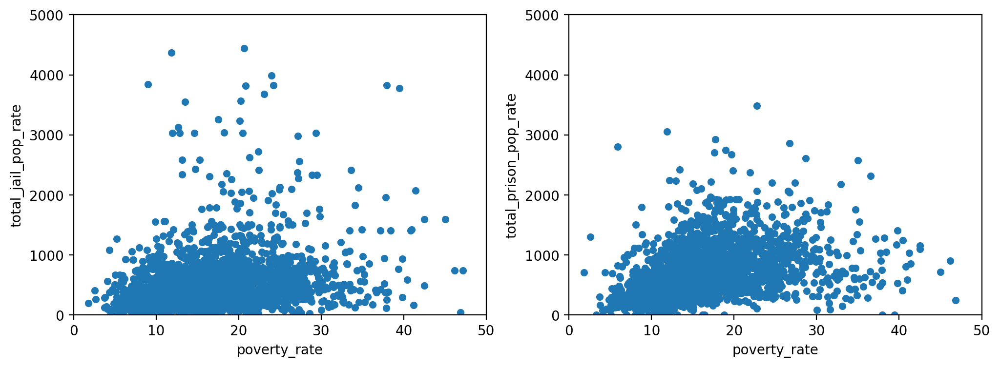

In [13]:
fig, axes = plt.subplots(1, 2, figsize=(12, 4))
rates_df = incarc_df[["total_jail_pop_rate", "total_prison_pop_rate"]].join(acs_poverty_df[["total_pop", "poverty_rate"]])
rates_df.plot.scatter(x="poverty_rate", y="total_jail_pop_rate", ax=axes[0])
rates_df.plot.scatter(x="poverty_rate", y="total_prison_pop_rate", ax=axes[1])
axes[0].set_xlim(0, 50)
axes[1].set_xlim(0, 50)
axes[0].set_ylim(0, 5000)
axes[1].set_ylim(0, 5000)
plt.show()

Doesn't look like there's a huge trend there, though some effect is more apparent wtih prison rates rather than jails.

(By the way, this initial plot cuts off at the rate of 5000 -- but the table above shows that the values go way higher!  So you can play around.)

Next, let's restrict to large urban counties, say counties over 1 million.

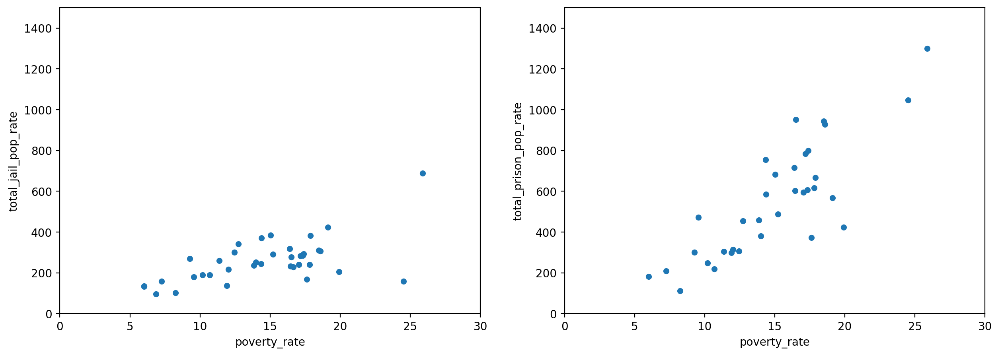

In [14]:
fig, axes = plt.subplots(1, 2, figsize=(15, 5))
rates_df = incarc_df[["total_jail_pop_rate", "total_prison_pop_rate"]].join(acs_poverty_df[["total_pop", "poverty_rate"]])

cutoff = 10 ** 6 # Try changing this!

rates_df[rates_df["total_pop"] > cutoff].plot.scatter(x="poverty_rate", y="total_jail_pop_rate", ax=axes[0])
rates_df[rates_df["total_pop"] > cutoff].plot.scatter(x="poverty_rate", y="total_prison_pop_rate", ax=axes[1])
axes[0].set_xlim(0, 30)
axes[1].set_xlim(0, 30)
axes[0].set_ylim(0, 1500)
axes[1].set_ylim(0, 1500)
plt.show()

A trend is now clear!

### Task: Parameter exploration

The scatterplots above treat all counties the same, but we know from the dataset that counties vary enormously in their urban-rural character.

The Vera dataframe has an `urbanicity` column. What's in it?

In [15]:
# Write code that lists the values in the urbanicity column, including their frequency.


## Ask for help if needed!

Your task is to create plotting code by urbanicity category.   You'll need to construct a list of colors to use.  Check out [latexcolor.com](https://latexcolor.com) for a huge menu of colors.

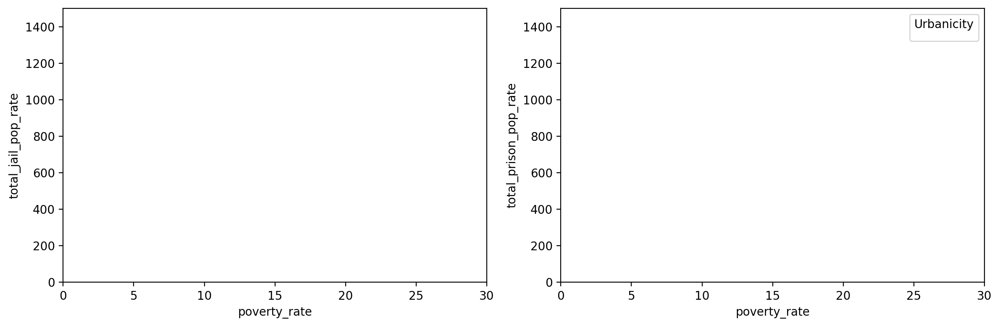

In [16]:
# Put the categories you want to plot into this list.
# Make sure you put strings in quotes.

urbanicity_categories_to_plot = [

]

cutoff = 0  # Population threshold for filtering counties -- Try changing this!

# Make a list of colors from which we'll draw in order.
# List them by their hex codes, e.g., #5D8AA8 for Air Force Blue.  (Still strings!)

colors = [ ]

rates_df = (
    incarc_df[["total_jail_pop_rate", "total_prison_pop_rate", "urbanicity"]]
    .join(acs_poverty_df[["total_pop", "poverty_rate"]])
    .dropna(subset=["urbanicity"])
)

# Build the dictionary from categories to colors.
urbanicity_colors = { category:color for category,color in zip(urbanicity_categories_to_plot,colors)}

# Build the color column directly
rates_df["color"] = rates_df["urbanicity"].map(urbanicity_colors)

# Filter to selected categories and population cutoff
plot_df = rates_df[
    rates_df["urbanicity"].isin(urbanicity_categories_to_plot)
    & (rates_df["total_pop"] > cutoff)
]

fig, axes = plt.subplots(1, 2, figsize=(12, 4))

for ax, y_var in zip(axes, ["total_jail_pop_rate", "total_prison_pop_rate"]):
    ax.scatter(
        plot_df["poverty_rate"],
        plot_df[y_var],
        c=plot_df["color"],
        alpha=1, # modify to change transparency of dots
    )
    ax.set_xlim(0, 30)
    ax.set_ylim(0, 1500)
    ax.set_xlabel("poverty_rate")
    ax.set_ylabel(y_var)

# `handles` is just used to make the legend
handles = [
    plt.Line2D([0], [0], marker="o", color="w",
               markerfacecolor=urbanicity_colors[cat],
               markersize=8, label=cat)
    for cat in urbanicity_categories_to_plot
]
axes[1].legend(handles=handles, title="Urbanicity", loc="upper right")

plt.tight_layout()
plt.show()

The plotting cell augmented the `rates_df` dataframe.  Let's see it.

In [17]:
rates_df

,total_jail_pop_rate,total_prison_pop_rate,urbanicity,total_pop,poverty_rate,color
fips,,,,,,
01001,453.38,502.84,small/mid,54598.0,12.266017,NaN
01003,485.97,618.44,small/mid,196640.0,12.993796,NaN
01005,667.75,902.36,rural,23641.0,26.373673,NaN
01007,485.47,341.14,suburban,20603.0,16.453914,NaN
01009,368.68,288.89,suburban,57099.0,16.534440,NaN
...,...,...,...,...,...,...
56037,450.69,847.17,rural,44166.0,11.022053,NaN
56039,154.10,135.61,rural,22524.0,7.325519,NaN
56041,361.01,345.65,rural,20658.0,16.758641,NaN


OK, let's focus on New York!  (FIPS code 36)

In [18]:
state_rates_df = rates_df[rates_df.index.str.startswith("36")]

In [19]:
xs = np.linspace(state_rates_df["poverty_rate"].min(), state_rates_df["poverty_rate"].max())

We're going to pick a particular regression model called "[Huber regression](https://en.wikipedia.org/wiki/Huber_loss)," which is designed to be robust to outliers.  It wouldn't make a big difference if we chose another one, just trying to be transparent about the choice.

Huber regression lets you choose a `sample_weight`, and we'll choose total population.  This means the points are sized by population, and it also means that the regression is weighted in terms of that variable.

In [20]:
model = HuberRegressor().fit(
    X=state_rates_df["poverty_rate"].to_numpy().reshape(-1, 1),
    y=state_rates_df["total_jail_pop_rate"],
    sample_weight=state_rates_df["total_pop"],
)
slope = model.coef_[0]
intercept = model.intercept_

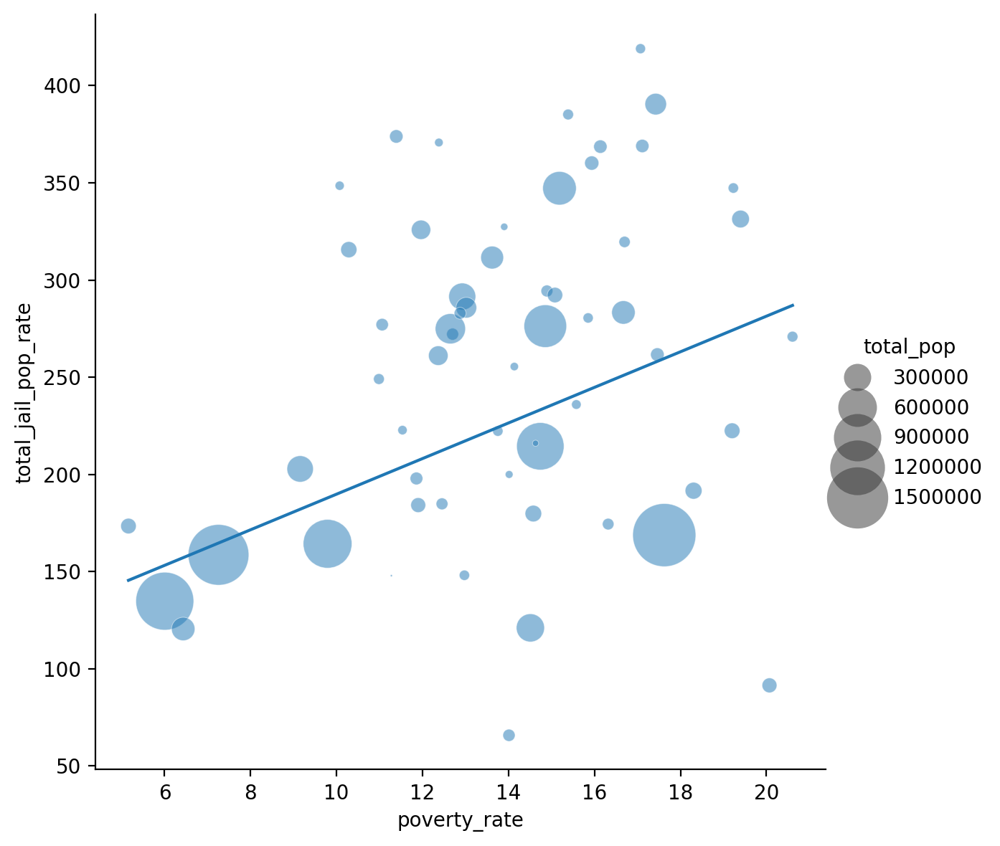

In [21]:
g = sns.relplot(
    x="poverty_rate",
    y="total_jail_pop_rate",
    size="total_pop",
    sizes=(1, 1000),
    alpha=.5,
    height=6,
    data=state_rates_df,
)

#g.set_axis_labels("Share of households below poverty line (%)", "Jail Population Rate (per 100,000)")

#g.set(ylim=(0, 1000))
plt.plot(xs, (slope * xs) + intercept)
plt.show()

What's the slope of that regression line?

In [22]:
print(f"Slope: {slope:.3f}")

Slope: 9.159


Let's see how this compares to an unweighted regression.

In [23]:
unweighted_model = HuberRegressor().fit(
    X=state_rates_df["poverty_rate"].to_numpy().reshape(-1, 1),
    y=state_rates_df["total_jail_pop_rate"],
)
unweighted_slope = unweighted_model.coef_[0]
unweighted_intercept = unweighted_model.intercept_

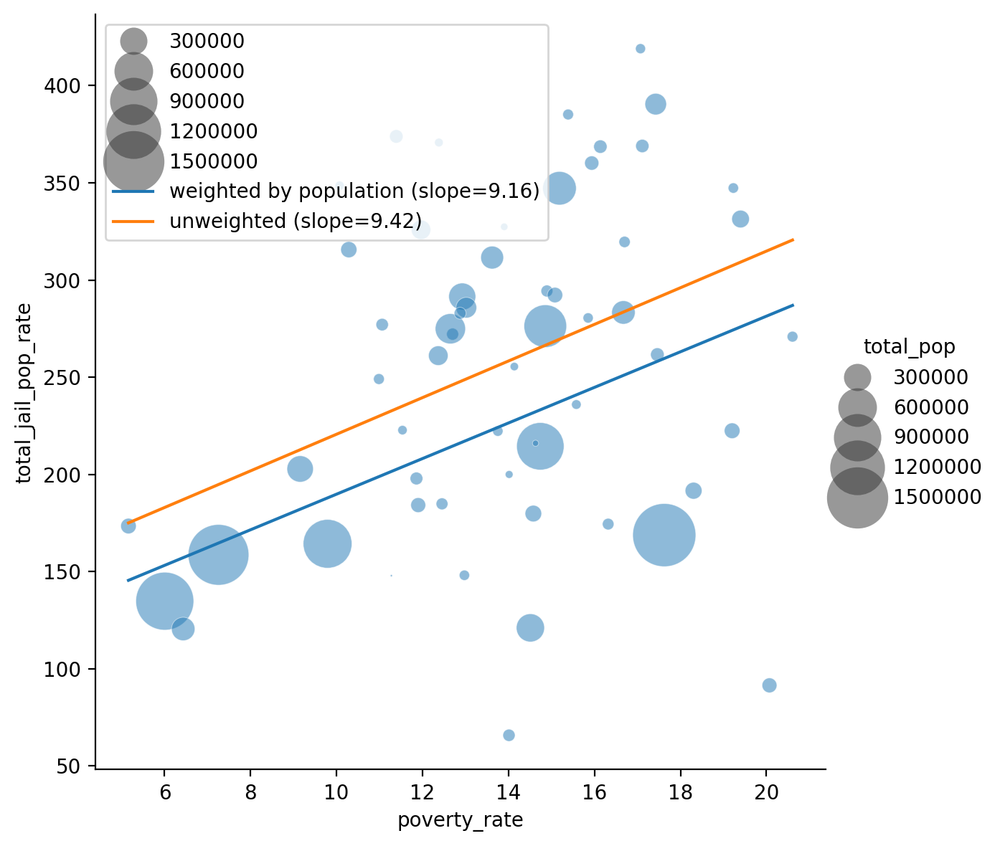

In [24]:
g = sns.relplot(
    x="poverty_rate",
    y="total_jail_pop_rate",
    size="total_pop",
    sizes=(1, 1000),
    alpha=.5,
    height=6,
    data=state_rates_df,
)
plt.plot(xs, (slope * xs) + intercept,
         label=f"weighted by population (slope={slope:.2f})")
plt.plot(xs, (unweighted_slope * xs) + unweighted_intercept,
         label=f"unweighted (slope={unweighted_slope:.2f})")
plt.legend()
plt.show()

In [25]:
print(f"Slope (weighted):   {slope:.3f}")
print(f"Slope (unweighted): {unweighted_slope:.3f}")

Slope (weighted):   9.159
Slope (unweighted): 9.423


So the slope barely changed, but the intercept moved.

One final small point! The variable names are on the axes, but they are a bit vague.  Above we mentioned how poverty rate is calculated. Let's do a tiny little bit of sleuthing to see how the jail rate is calculated.  Is it as a share of total population, or adults, or what?  We'll start by finding the county with the highest rate using `argmax`.

In [26]:
incarc_df.iloc[incarc_df["total_jail_pop_rate"].argmax()][["total_pop", "total_jail_pop", "total_jail_pop_rate"]]

,48125
total_pop,2201
total_jail_pop,368.45
total_jail_pop_rate,26450.11


Index 48125 is Dickens County, TX.  Well, `jail_pop`/`total_pop` is stunning: about 1.7% of the county is in jail.  (That rivals El Salvador!)

Let's make a guess after a bit of googling.  Maybe `total_jail_pop_rate` is the share of 15-64 year olds who are incarcerated, per 100,000.  Let's check to see if that's right.

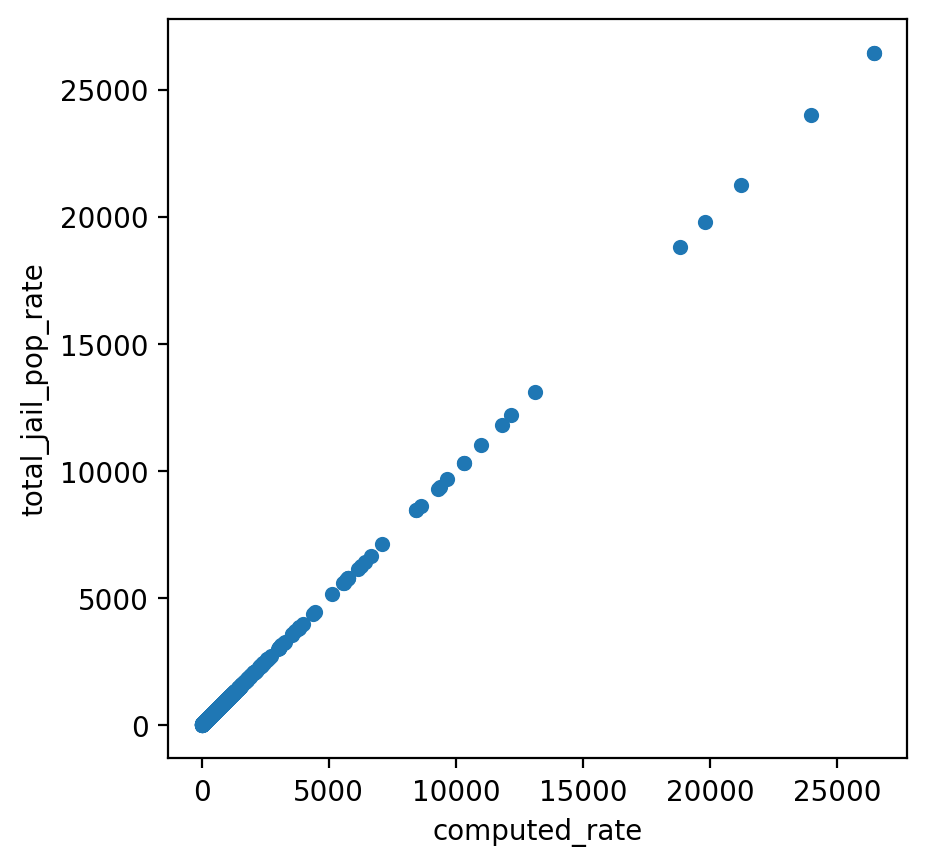

In [27]:
ax = pd.DataFrame({
    'computed_rate': (100000 * incarc_df["total_jail_pop"] / incarc_df["total_pop_15to64"]),
    'total_jail_pop_rate': incarc_df["total_jail_pop_rate"]
}).plot.scatter(x='computed_rate', y='total_jail_pop_rate')
ax.set_aspect('equal')
plt.show()

Success!  Falling along a straight diagonal line says that y=x, meaning that the two things we are comparing are indeed equal.

## Police interactions: A tale of two cities

New topic!  Who gets arrested, and how do police "incidents" look, in two major American cities?  We'll start with San Francisco.

In [28]:
# @markdown This cell retrieves the policing SQLite database from GitHub and
# @markdown unzips it into the file "police.sqlite3" so we may use it.

# NOTE: The file in the zip archive will be called "police.sqlite3" despite
# the zip file having a different name.
police_zipped_data = requests.get("https://github.com/ds-20195/notebooks/raw/refs/heads/main/notebook_data/Notebook7_arrests.sqlite3.zip")
with zipfile.ZipFile(io.BytesIO(police_zipped_data.content)) as police_zip:
    police_zip.extractall()

In [29]:
police_db = sqlite3.connect("arrests.sqlite3")

### Policing in San Francisco

We're pulling from a dataset provided by the city (DataSF): [Police Department Incident Reports: 2018 to Present](https://data.sfgov.org/Public-Safety/Police-Department-Incident-Reports-2018-to-Present/wg3w-h783/about_data)

In [30]:
sf_incidents_df = pd.read_sql_query("SELECT * FROM sf", police_db)
for column in ("incident_datetime", "report_datetime"):
    sf_incidents_df[column] = pd.to_datetime(
        sf_incidents_df[column],
        format="ISO8601",
    )

In [31]:
sf_incidents_df

,incident_datetime,report_datetime,incident_category,incident_subcategory,incident_description,intersection,police_district,neighborhood,supervisor_district,lat,lon
0,2021-07-07 08:18:00,2021-07-07 08:28:00,Assault,Simple Assault,Battery,23RD ST \ MISSION ST,Mission,Mission,9.0,37.753837,-122.418594
1,2021-06-04 09:40:00,2021-06-04 09:42:00,Assault,Simple Assault,Battery,GEARY ST \ POLK ST,Northern,Tenderloin,5.0,37.785893,-122.419739
2,2022-05-07 21:02:00,2022-05-07 21:25:00,Assault,Simple Assault,Battery,MASON ST \ DERBY ST,Central,Tenderloin,3.0,37.787429,-122.409931
3,2021-09-30 09:00:00,2021-09-30 09:22:00,Assault,Simple Assault,Battery,16TH ST \ MISSION ST,Mission,Mission,9.0,37.765051,-122.419669
4,2021-12-18 00:45:00,2021-12-18 00:45:00,Other Miscellaneous,Other,Investigative Detention,POLK ST \ FERN ST,Northern,Nob Hill,3.0,37.788223,-122.420210
...,...,...,...,...,...,...,...,...,...,...,...
179764,2025-03-13 19:12:00,2025-03-13 19:15:00,Drug Offense,Drug Violation,"Narcotics Paraphernalia, Possession of",EDDY ST \ LEAVENWORTH ST,Tenderloin,Tenderloin,5.0,37.783722,-122.414238
179765,2025-03-14 13:35:00,2025-03-14 13:35:00,Other Miscellaneous,Loitering,Lodging Without Permission,19TH ST \ MISSION ST,Mission,Mission,9.0,37.760235,-122.419205
179766,2025-03-14 11:03:00,2025-03-14 11:03:00,Larceny Theft,Larceny Theft - From Building,"Theft, From Building, >$950",BOARDMAN PL \ BRYANT ST,Southern,South of Market,6.0,37.775162,-122.403633
179767,2025-03-14 09:07:00,2025-03-14 09:07:00,Drug Offense,Drug Violation,"Narcotics Paraphernalia, Possession of",05TH ST \ MISSION ST,Southern,South of Market,6.0,37.782730,-122.406479


We can group these records into monthly buckets using the  `groupby` method. Here, `pd.Grouper` tells pandas to bin `incident_datetime` by month-end date.

("ME" stands for "Month End". See the [pandas offset alias documentation](https://pandas.pydata.org/docs/user_guide/timeseries.html#offset-aliases) for other options)


In [32]:
sf_counts_by_intersection_month = sf_incidents_df.groupby(
    # latitudes/longitudes correspond to street intersections
    [pd.Grouper(key="incident_datetime", freq="ME"), "lat", "lon"]
).count()["report_datetime"]
sf_counts_by_intersection_month

incident_datetime  lat        lon        
2018-01-31         37.708855  -122.405113    2
                   37.708999  -122.458241    1
                   37.709098  -122.405981    1
                   37.709540  -122.439631    2
                   37.709679  -122.453888    2
                                            ..
2025-03-31         37.801689  -122.414490    3
                   37.802826  -122.413033    3
                   37.806499  -122.436104    1
                   37.828342  -122.377098    1
                   37.829449  -122.376007    1
Name: report_datetime, Length: 65898, dtype: int64

This last column is a **count** of how many different reports were made on each month in that location.

In [33]:
sf_counts_by_intersection_month.sort_values().tail(20)

,,,report_datetime
incident_datetime,lat,lon,
2023-04-30,37.779212,-122.410937,62
2025-02-28,37.780537,-122.408157,64
2019-07-31,37.786410,-122.408036,64
2019-01-31,37.786410,-122.408036,65
2024-03-31,37.782570,-122.430801,68
2023-06-30,37.779212,-122.410937,70
2024-11-30,37.781754,-122.409691,71
2024-02-29,37.782570,-122.430801,74
2023-05-31,37.779212,-122.410937,74


So there were a few locations (all close together) with more than 100 incidents in a single month!  You can check it out by pasting these lat/long coordinates into Google Maps -- these are all in or near the notorious neighborhood called the [Tenderloin](https://en.wikipedia.org/wiki/Tenderloin,_San_Francisco).  (Wikipedia puts its center at 37.7833 / -122.4167)

In [34]:
def to_heatmap(counts_by_date, max_incidents=None, date_format="%B %Y"):
    if max_incidents is None:
        # Max-normalize: for the heatmap, weights should be between 0 and 1.
        max_incidents = counts_by_date.max()

    heatmap = []
    heatmap_time_index = []
    # counts_by_date is expected to the(incident_datetime, lat, long) multiindex
    # We group by datetime and then iterate through the groups.
    for date, date_df in counts_by_date.groupby(level=0):
        # Each group contains one value of incident_datetime, so we drop that
        # part of the index since it is stored in `date`
        incident_matrix = date_df.droplevel(0).reset_index().values
        incident_matrix[:, 2] = np.minimum(incident_matrix[:, 2] / max_incidents, 1)
        heatmap.append(incident_matrix.tolist())
        heatmap_time_index.append(date.strftime(date_format))

    return heatmap, heatmap_time_index

In [35]:
sf_heatmap, sf_heatmap_time_index = to_heatmap(sf_counts_by_intersection_month, max_incidents=50)

How far back does this dataset go?

In [36]:
sf_heatmap_time_index[:5]

['January 2018', 'February 2018', 'March 2018', 'April 2018', 'May 2018']

Let's map it.

In [37]:
sf_map = folium.Map(location=(37.73, -122.4194), tiles="cartodb positron", zoom_start=12)

sf_incidents_heatmap = folium.plugins.HeatMapWithTime(
    sf_heatmap,
    index=sf_heatmap_time_index,
    auto_play=True,
    max_opacity=0.3,
)
sf_incidents_heatmap.add_to(sf_map)


# Create a colormap matching Leaflet.heat's default gradient
colormap = cm.LinearColormap(
    colors=["blue", "cyan", "lime", "yellow", "red"],
    vmin=0,
    vmax=1,  # heatmap intensity is always normalized 0–1
    caption="Density (relative)"
)
colormap.add_to(sf_map)

sf_map

So the incident rate is really high in the Tenderloin. Let's see if we can extract any more information from our dataset.

Frequently, temporal datastes tend to display patterns across days or months, so we'll try grouping our data by day of the week.

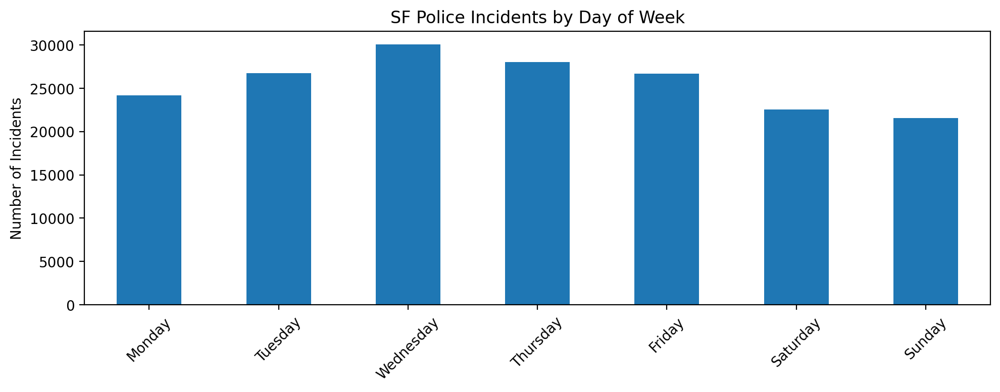

In [38]:
sf_incidents_df["day_of_week"] = sf_incidents_df["incident_datetime"].dt.day_name()

day_order = ["Monday", "Tuesday", "Wednesday", "Thursday", "Friday", "Saturday", "Sunday"]

day_counts = sf_incidents_df.groupby("day_of_week").size().reindex(day_order)

day_counts.plot.bar(figsize=(10, 4), title="SF Police Incidents by Day of Week")
plt.xlabel("")
plt.ylabel("Number of Incidents")
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()

So weekdays seem to have more incident activity in San Francisco compared to weekends. What about in the Tenderloin?

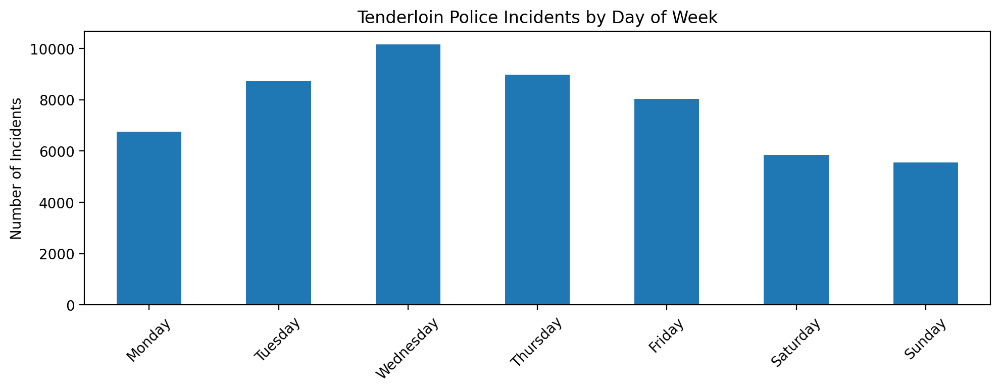

In [39]:
# Approximate bounding box for the Tenderloin, SF
lat_min, lat_max = 37.776, 37.788
lon_min, lon_max = -122.421, -122.407

tenderloin_df = sf_incidents_df[
    (sf_incidents_df["lat"] > lat_min) & (sf_incidents_df["lat"] < lat_max) &
    (sf_incidents_df["lon"] > lon_min) & (sf_incidents_df["lon"] < lon_max)
].copy()

tenderloin_df["day_of_week"] = tenderloin_df["incident_datetime"].dt.day_name()

day_order = ["Monday", "Tuesday", "Wednesday", "Thursday", "Friday", "Saturday", "Sunday"]

day_counts = tenderloin_df.groupby("day_of_week").size().reindex(day_order)

day_counts.plot.bar(figsize=(10, 4), title="Tenderloin Police Incidents by Day of Week")
plt.xlabel("")
plt.ylabel("Number of Incidents")
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()

### Discussion: Wednesdays in the Tenderloin

There is a notable increase in the number of police incidents in the Tenderloin on Wednesdays. What could explain this?

### Arrests in Chicago
OK let's do the parallel data munge, from the [Chicago Data Portal](https://data.cityofchicago.org/Public-Safety/Arrests/dpt3-jri9/about_data).

In [40]:
chicago_arrests_df = pd.read_sql_query("SELECT * FROM chicago", police_db)
for column in ("date", "updated_on"):
    chicago_arrests_df[column] = pd.to_datetime(
        chicago_arrests_df[column],
        format="ISO8601",
    )

It should be interesting to check out the types and descriptions of the arrests.

In [41]:
chicago_arrests_df

,case_number,date,block,iucr,type,Description,location_type,is_domestic,beat,district,ward,community_area,fbi_code,updated_on,lat,lon
0,JC100006,2018-12-31 23:56:00,018XX S ALLPORT ST,0440,BATTERY,AGG: HANDS/FIST/FEET NO/MINOR INJURY,OTHER,0,1233,12,25,31,08B,2019-01-10 15:16:50,41.857068,-87.657625
1,JB574407,2018-12-31 23:44:00,047XX N RACINE AVE,1330,CRIMINAL TRESPASS,TO LAND,MOVIE HOUSE/THEATER,0,1913,19,46,3,26,2019-01-10 15:16:50,41.968463,-87.659670
2,JC100036,2018-12-31 23:43:00,071XX S VINCENNES AVE,143A,WEAPONS VIOLATION,UNLAWFUL POSS OF HANDGUN,GAS STATION,0,731,7,6,69,15,2019-01-10 15:16:50,41.764632,-87.628312
3,JC100004,2018-12-31 23:42:00,030XX N MARMORA AVE,2022,NARCOTICS,POSS: COCAINE,ALLEY,0,2514,25,30,19,18,2019-01-10 15:16:50,41.935640,-87.773689
4,JC100117,2018-12-31 23:40:00,088XX S COTTAGE GROVE AVE,1477,WEAPONS VIOLATION,RECKLESS FIREARM DISCHARGE,STREET,0,632,6,8,44,15,2019-01-10 15:16:50,41.733551,-87.604749
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
272993,JH100001,2024-01-01 00:04:00,034XX W WALNUT ST,0496,BATTERY,AGGRAVATED DOMESTIC BATTERY - KNIFE / CUTTING ...,APARTMENT,1,1123,11,28,27,04B,2024-12-21 15:40:46,41.885448,-87.711803
272994,JH459217,2024-01-01 00:00:00,054XX N KIMBALL AVE,1582,OFFENSE INVOLVING CHILDREN,CHILD PORNOGRAPHY,APARTMENT,1,1712,17,39,13,17,2025-01-20 15:40:22,41.980153,-87.713656
272995,JH227698,2024-01-01 00:00:00,050XX S MICHIGAN AVE,0281,CRIMINAL SEXUAL ASSAULT,NON-AGGRAVATED,OTHER (SPECIFY),0,224,2,3,38,02,2025-03-04 15:40:37,41.803366,-87.622683
272996,JH100099,2024-01-01 00:00:00,034XX W DRUMMOND PL,0486,BATTERY,DOMESTIC BATTERY SIMPLE,APARTMENT,1,1412,14,35,22,08B,2024-12-21 15:40:46,41.929276,-87.713263


In [42]:
chicago_counts_by_loc_month = chicago_arrests_df.groupby(
    # latitudes/longitudes correspond to street intersections
    [pd.Grouper(key="date", freq="ME"), "lat", "lon"]
).count()["ward"]

In [43]:
chicago_heatmap, chicago_heatmap_time_index = to_heatmap(chicago_counts_by_loc_month, max_incidents=10)

Now we plot the heatmap.

Chicago police (and all city workers) have a *residency requirement*—they must live in the city.  This has produced three different police neighborhoods, with very high residency rates of police.  I've added some optional code to plot those on the map.

In [44]:
chicago_map = folium.Map(location=(41.8407, -87.6794), tiles="cartodb positron", zoom_start=11)
chicago_arrests_heatmap = folium.plugins.HeatMapWithTime(
    chicago_heatmap,
    index=chicago_heatmap_time_index,
    auto_play=True,
    max_opacity=0.3,
)
chicago_arrests_heatmap.add_to(chicago_map)

# Add police neighborhood markers
# neighborhoods = {
#    "Norwood Park": (41.9853, -87.8136),
#    "Mount Greenwood": (41.6948, -87.7136),
#    "Garfield Ridge": (41.7865, -87.7702),
# }
# for name, (lat, lon) in neighborhoods.items():
#    folium.CircleMarker(
#        location=(lat, lon),
#        radius=6,
#        color="red",
#        fill=True,
#        fill_opacity=0.9,
#        popup=name,
#    ).add_to(chicago_map)

# Create a colormap matching Leaflet.heat's default gradient
colormap = cm.LinearColormap(
    colors=["blue", "cyan", "lime", "yellow", "red"],
    vmin=0,
    vmax=1,  # heatmap intensity is always normalized 0–1
    caption="Density (relative)"
)
colormap.add_to(chicago_map)

chicago_map

How about slicing by days of the week again? Will arrests go down on the weekend like incidents did in San Francisco?



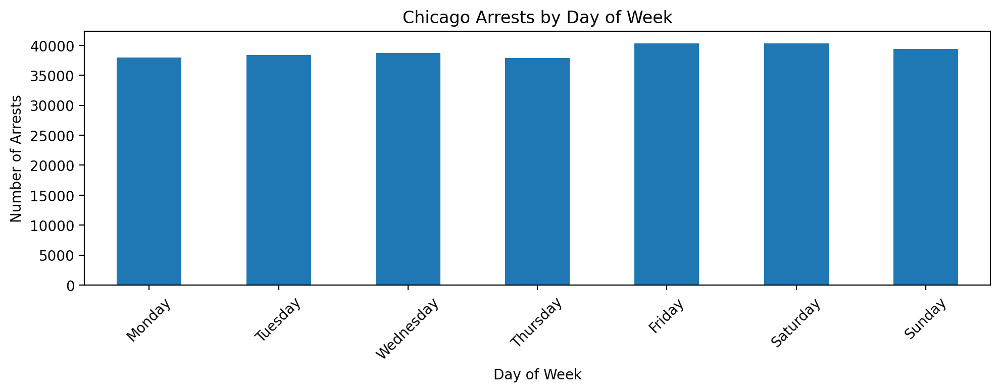

In [45]:
chicago_arrests_df["day_of_week"] = chicago_arrests_df["date"].dt.day_name()

day_order = ["Monday", "Tuesday", "Wednesday", "Thursday", "Friday", "Saturday", "Sunday"]

day_counts = chicago_arrests_df.groupby("day_of_week").size().reindex(day_order)

day_counts.plot.bar(figsize=(10, 4), title="Chicago Arrests by Day of Week")
plt.xlabel("Day of Week")
plt.ylabel("Number of Arrests")
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()

### Final discussion

We've set up dataframes to look at San Francisco and Chicago, but haven't done too much that is comparative.  Thinking back to how we handled the data in both cases, what would be some steps towards a comparative analysis?

Ideas might include: incidents vs. arrests, cutoffs in plotting, and so on.

# Homework 7

**Warmup question:** In all of Chicago, how many arrests are in the dataset for the calendar year 2024?  How many of these were narcotics arrests?

**Data product:** It's time to break down Chicago by [community area](https://en.wikipedia.org/wiki/Community_areas_of_Chicago)!  There are 77 of these, devised by sociologists at UChicago in the 1920s.  Your data product this week should examine arrests in Chicago with reference to community areas.  For instance, a basic and solid idea would be to compare per capita arrest rates by community area.  But feel free to be creative!

In [46]:
url = "https://data.cityofchicago.org/resource/igwz-8jzy.geojson?$limit=100"

resp = requests.get(url, timeout=30)
resp.raise_for_status()

community_areas = gpd.read_file(io.BytesIO(resp.content))

# SODA returns these as strings; coerce the numeric one
community_areas["area_numbe"] = community_areas["area_numbe"].astype(int)
community_areas = community_areas.rename(
    columns={"area_numbe": "area_num", "community": "name"}
)

# Reproject to IL State Plane East (meters) for sane distance/area math
community_areas = community_areas.to_crs(epsg=26971)

print(community_areas.shape)   # (77, ...)
community_areas.head()

(77, 6)


,name,shape_area,area_num_1,area_num,shape_len,geometry
0,ROGERS PARK,51259902.4506,1,1,34052.3975757,"MULTIPOLYGON (((356237.576 592121.821, 356139...."
1,WEST RIDGE,98429094.8621,2,2,43020.6894583,"MULTIPOLYGON (((353726.032 594470.382, 353727...."
2,UPTOWN,65095642.7289,3,3,46972.7945549,"MULTIPOLYGON (((357397.618 587314.391, 357151...."
3,LINCOLN SQUARE,71352328.2399,4,4,36624.6030848,"MULTIPOLYGON (((354611.686 589658.442, 354612...."
4,NORTH CENTER,57054167.85,5,5,31391.6697542,"MULTIPOLYGON (((354735.595 584798.593, 354731...."


**Reading response:** Jimmy Carter was a peanut farmer from Georgia who was elected as a one-term president in 1976, right before Reagan gave the whole country what you might call a vibe reboot with a kind of butch right-wing optimism.  Carter is remembered as a dorky lefty, and after his presidency he was associated with Habitat for Humanity and for using "apartheid" language to describe conditions in Palestine.  I say this to set the scene.  In class, I briefly described Carter as trying unsuccessfully to fight the rising punitive tide in crime policy.  Hinton does give some evidence for this, but we could also read her as arguing that his liberal credentials are part of the story of how carceral expansion got bipartisan legitimacy.  Dig into that question -- cite a passage that illuminates some subtleties of Carter's role, and use details from the text to explain the overall conclusion you're left with.